**<h1>Imports & Global Setup</h1>**

In [1]:
import os
import glob
import random
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.densenet import preprocess_input as densenet_preprocess
from tensorflow.keras.layers import (Dense, Dropout, GlobalAveragePooling2D,
                                     BatchNormalization)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# Reproducibility
SEED = 100
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)

# GPU check
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

# ======================================================
# 1) CONFIG (OFFLINE-SAFE PRETRAINED WEIGHTS TOGGLE)
# ======================================================
# If you later upload local ImageNet weights .h5 to Kaggle (Input tab), set:
# USE_IMAGENET_WEIGHTS = True
# IMAGENET_WEIGHTS_PATH = '/kaggle/input/densenet121-notop/densenet121_weights_tf_dim_ordering_tf_kernels_notop.h5'

USE_IMAGENET_WEIGHTS = False       # keep False to avoid internet download
IMAGENET_WEIGHTS_PATH = None       # set a local .h5 path if you upload weights

if USE_IMAGENET_WEIGHTS and IMAGENET_WEIGHTS_PATH is not None:
    assert os.path.exists(IMAGENET_WEIGHTS_PATH), f"Weights file not found at {IMAGENET_WEIGHTS_PATH}"
print(f"Using ImageNet weights? {USE_IMAGENET_WEIGHTS}; Local path: {IMAGENET_WEIGHTS_PATH}")

# Image + batching params
IMG_SIZE = (128, 128)
BATCH_SIZE = 32


Num GPUs Available: 0
Using ImageNet weights? False; Local path: None


<h1>Data Discovery & Labeling</h1>

In [2]:
DATA_GLOB = '/kaggle/input/breakhis/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/**/*.png'
breast_img_paths = glob.glob(DATA_GLOB, recursive=True)
print("Total images found:", len(breast_img_paths))

# Subtype maps according to BreakHis naming conventions
# e.g., SOB_B_A-...  => index 4 = 'B' (Benign), index 6 = subtype letter
benign_map = {'A':0, 'F':1, 'P':2, 'T':3}   # Adenosis, Fibroadenoma, Phyllodes, Tubular adenoma
malig_map  = {'D':0, 'L':1, 'M':2, 'P':3}   # Ductal, Lobular, Mucinous, Papillary carcinoma

file_paths, binary_labels, benign_labels, malignant_labels = [], [], [], []

for p in breast_img_paths:
    name = Path(p).name
    file_paths.append(p)
    # Binary label at position 4 ('B' or 'M')
    if len(name) > 6 and name[4] == 'B':
        binary_labels.append(0)  # benign
        benign_labels.append(benign_map.get(name[6], None))
        malignant_labels.append(None)
    else:
        binary_labels.append(1)  # malignant
        benign_labels.append(None)
        malignant_labels.append(malig_map.get(name[6], None))

df = pd.DataFrame({
    'filepath': file_paths,
    'binary_label': binary_labels,
    'benign_label': benign_labels,
    'malignant_label': malignant_labels
})
print(df.head())



Total images found: 7909
                                            filepath  binary_label  \
0  /kaggle/input/breakhis/BreaKHis_v1/BreaKHis_v1...             0   
1  /kaggle/input/breakhis/BreaKHis_v1/BreaKHis_v1...             0   
2  /kaggle/input/breakhis/BreaKHis_v1/BreaKHis_v1...             0   
3  /kaggle/input/breakhis/BreaKHis_v1/BreaKHis_v1...             0   
4  /kaggle/input/breakhis/BreaKHis_v1/BreaKHis_v1...             0   

   benign_label  malignant_label  
0           0.0              NaN  
1           0.0              NaN  
2           0.0              NaN  
3           0.0              NaN  
4           0.0              NaN  


<h1> Train, Val, Test Split (Stratified on Binary)</h1>

In [3]:
train_df, test_df = train_test_split(
    df, test_size=0.2, stratify=df['binary_label'], random_state=SEED
)
train_df, val_df = train_test_split(
    train_df, test_size=0.25, stratify=train_df['binary_label'], random_state=SEED
)
print(f"Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")



Train: 4745 | Val: 1582 | Test: 1582


<h1>Augumentation & Preprocessing Pipeline</h1>

In [4]:
# Use slightly stronger augmentation if training from scratch (weights=None)
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.15 if not USE_IMAGENET_WEIGHTS else 0.10),
    tf.keras.layers.RandomZoom(0.20 if not USE_IMAGENET_WEIGHTS else 0.10),
    tf.keras.layers.RandomContrast(0.20 if not USE_IMAGENET_WEIGHTS else 0.10),
])

def preprocess_fn(img_float32):
    """Apply DenseNet preprocess when using pretrained weights, else scale [0,1]."""
    if USE_IMAGENET_WEIGHTS:
        return densenet_preprocess(img_float32)
    else:
        return img_float32 / 255.0

def load_and_preprocess(path, label):
    """Reads PNG, resizes, casts to float32, applies preprocess_fn, returns (img, label)."""
    img = tf.io.read_file(path)
    img = tf.image.decode_png(img, channels=3)
    img = tf.image.resize(img, IMG_SIZE)
    img = tf.cast(img, tf.float32)
    img = preprocess_fn(img)
    return img, label

def create_dataset(df_in, label_col, augment=False):
    """Build tf.data.Dataset from DataFrame for a given label column."""
    df_clean = df_in.dropna(subset=[label_col]).copy()
    paths = df_clean['filepath'].values
    labels = df_clean[label_col].astype(int).values
    num_classes = 2 if label_col == 'binary_label' else 4
    labels = tf.keras.utils.to_categorical(labels, num_classes=num_classes)

    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    if augment:
        ds = ds.map(lambda x, y: (data_augmentation(x, training=True), y),
                    num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.shuffle(1000, seed=SEED).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

# Build datasets
train_binary_ds = create_dataset(train_df, 'binary_label', augment=True)
val_binary_ds   = create_dataset(val_df,   'binary_label', augment=False)
test_binary_ds  = create_dataset(test_df,  'binary_label', augment=False)

train_benign_ds = create_dataset(train_df[train_df['binary_label']==0], 'benign_label', augment=True)
val_benign_ds   = create_dataset(val_df[val_df['binary_label']==0],     'benign_label', augment=False)
test_benign_ds  = create_dataset(test_df[test_df['binary_label']==0],   'benign_label', augment=False)

train_malig_ds  = create_dataset(train_df[train_df['binary_label']==1], 'malignant_label', augment=True)
val_malig_ds    = create_dataset(val_df[val_df['binary_label']==1],     'malignant_label', augment=False)
test_malig_ds   = create_dataset(test_df[test_df['binary_label']==1],   'malignant_label', augment=False)


<h1>Model Factory (DenseNet121 Head) & Callbacks</h1>

In [5]:
def build_densenet_model(num_classes):
    """DenseNet121 base (frozen), GAP + small head -> softmax(num_classes)."""
    if USE_IMAGENET_WEIGHTS and IMAGENET_WEIGHTS_PATH:
        weights_arg = IMAGENET_WEIGHTS_PATH  # local .h5 (offline)
    elif USE_IMAGENET_WEIGHTS and not IMAGENET_WEIGHTS_PATH:
        weights_arg = 'imagenet'             # will try to download (requires internet)
    else:
        weights_arg = None                   # train from scratch (offline-safe)

    base = DenseNet121(weights=weights_arg, include_top=False,
                       input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3))
    base.trainable = False  # initial freeze

    x = base.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001))(x)
    x = BatchNormalization()(x)
    x = Dropout(0.4)(x)
    out = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base.input, outputs=out)
    return model

def compile_model(model, lr=1e-4):
    model.compile(optimizer=Adam(lr), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Callbacks (shared)
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr  = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)



<h1>Train Binary Classification Model</h1>

In [6]:
binary_model = build_densenet_model(num_classes=2)
compile_model(binary_model, lr=1e-4)

EPOCHS_BINARY = 60 if not USE_IMAGENET_WEIGHTS else 30  # longer when training from scratch

history_binary = binary_model.fit(
    train_binary_ds,
    validation_data=val_binary_ds,
    epochs=EPOCHS_BINARY,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

print("\nBinary model evaluation (test):")
binary_model.evaluate(test_binary_ds, verbose=1)



Epoch 1/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 251s 2s/step - accuracy: 0.6530 - loss: 0.7448 - val_accuracy: 0.6865 - val_loss: 0.7157 - learning_rate: 1.0000e-04
Epoch 2/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 199s 1s/step - accuracy: 0.7679 - loss: 0.5935 - val_accuracy: 0.6865 - val_loss: 0.6509 - learning_rate: 1.0000e-04
Epoch 3/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 191s 1s/step - accuracy: 0.8125 - loss: 0.5309 - val_accuracy: 0.7674 - val_loss: 0.5817 - learning_rate: 1.0000e-04
Epoch 4/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 194s 1s/step - accuracy: 0.8274 - loss: 0.4986 - val_accuracy: 0.8432 - val_loss: 0.5179 - learning_rate: 1.0000e-04
Epoch 5/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 191s 1s/step - accuracy: 0.8340 - loss: 0.4830 - val_accuracy: 0.8407 - val_loss: 0.4687 - learning_rate: 1.0000e-04
Epoch 6/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 195s 1s/step - accuracy: 0.8358 - loss: 0.4715 - val_accuracy: 0.8369 - val_loss: 0.4647 - learning_rate: 1.0000e-04
Epoch 7/60
149/149 ━━━━━━━━━━━━━━━━━━━━ 190s 1s/step - acc

[0.4499284029006958, 0.8445006608963013]

<h1>Train Benign SubType Model ( 4 Classes)</h1>

In [7]:
benign_model = build_densenet_model(num_classes=4)
compile_model(benign_model, lr=1e-4)

EPOCHS_BENIGN = 60 if not USE_IMAGENET_WEIGHTS else 30

history_benign = benign_model.fit(
    train_benign_ds,
    validation_data=val_benign_ds,
    epochs=EPOCHS_BENIGN,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

print("\nBenign model evaluation (test):")
benign_model.evaluate(test_benign_ds, verbose=1)


Epoch 1/60
47/47 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.2667 - loss: 1.5035 - val_accuracy: 0.4073 - val_loss: 1.4667 - learning_rate: 1.0000e-04
Epoch 2/60
47/47 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.3387 - loss: 1.4579 - val_accuracy: 0.4073 - val_loss: 1.4473 - learning_rate: 1.0000e-04
Epoch 3/60
47/47 ━━━━━━━━━━━━━━━━━━━━ 60s 1s/step - accuracy: 0.3662 - loss: 1.4143 - val_accuracy: 0.4073 - val_loss: 1.4309 - learning_rate: 1.0000e-04
Epoch 4/60
47/47 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.3638 - loss: 1.4094 - val_accuracy: 0.4073 - val_loss: 1.4196 - learning_rate: 1.0000e-04
Epoch 5/60
47/47 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.3711 - loss: 1.3864 - val_accuracy: 0.4073 - val_loss: 1.4063 - learning_rate: 1.0000e-04

Benign model evaluation (test):
16/16 ━━━━━━━━━━━━━━━━━━━━ 15s 798ms/step - accuracy: 0.4378 - loss: 1.4665


[1.4675781726837158, 0.44556450843811035]

<h1>Train Malignant SubType Model ( 4 Classes )</h1>

In [8]:
malig_model = build_densenet_model(num_classes=4)
compile_model(malig_model, lr=1e-4)

EPOCHS_MALIG = 60 if not USE_IMAGENET_WEIGHTS else 30

history_malig = malig_model.fit(
    train_malig_ds,
    validation_data=val_malig_ds,
    epochs=EPOCHS_MALIG,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

print("\nMalignant model evaluation (test):")
malig_model.evaluate(test_malig_ds, verbose=1)


Epoch 1/60
102/102 ━━━━━━━━━━━━━━━━━━━━ 151s 1s/step - accuracy: 0.3837 - loss: 1.4666 - val_accuracy: 0.1713 - val_loss: 1.4917 - learning_rate: 1.0000e-04
Epoch 2/60
102/102 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.4906 - loss: 1.3666 - val_accuracy: 0.6262 - val_loss: 1.4140 - learning_rate: 1.0000e-04
Epoch 3/60
102/102 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step - accuracy: 0.5202 - loss: 1.2818 - val_accuracy: 0.6483 - val_loss: 1.3142 - learning_rate: 1.0000e-04
Epoch 4/60
102/102 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - accuracy: 0.5612 - loss: 1.2160 - val_accuracy: 0.6464 - val_loss: 1.2319 - learning_rate: 1.0000e-04
Epoch 5/60
102/102 ━━━━━━━━━━━━━━━━━━━━ 130s 1s/step - accuracy: 0.6007 - loss: 1.1612 - val_accuracy: 0.6483 - val_loss: 1.1496 - learning_rate: 1.0000e-04

Malignant model evaluation (test):
34/34 ━━━━━━━━━━━━━━━━━━━━ 32s 790ms/step - accuracy: 0.1655 - loss: 1.4911


[1.4923572540283203, 0.15377531945705414]

<h1>Evaluation Util & (Precison/Recall/F1 + Confusion Matrix)</h1>

Precision: 0.8253 | Recall: 0.8051 | F1: 0.8138


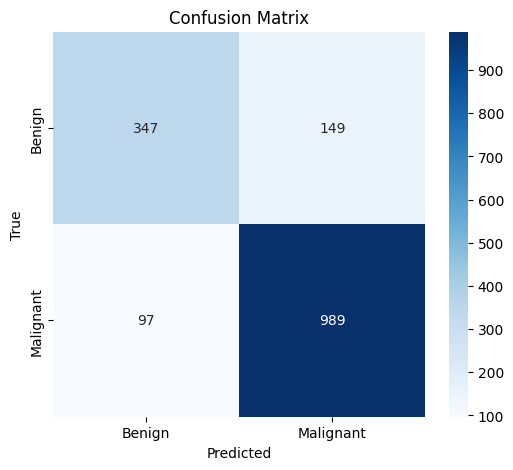

Precision: 0.1114 | Recall: 0.2500 | F1: 0.1541


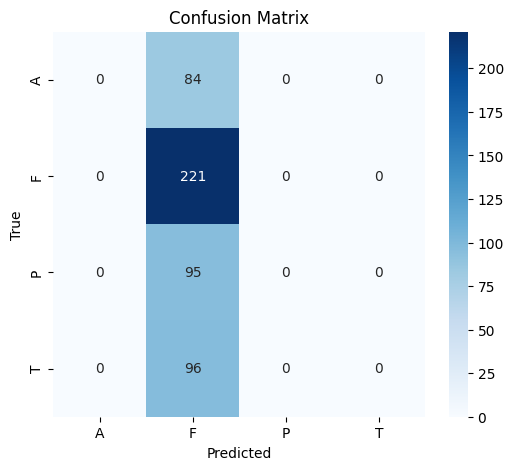

Precision: 0.2481 | Recall: 0.2519 | F1: 0.0761


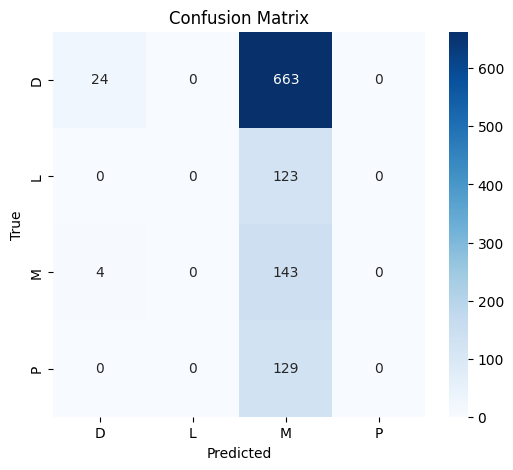

In [9]:
def evaluate_model(model, dataset, class_names):
    """Compute macro Precision/Recall/F1 and plot Confusion Matrix."""
    y_true, y_pred = [], []
    for imgs, labels in dataset:
        preds = model.predict(imgs, verbose=0)
        y_true.extend(np.argmax(labels, axis=1))
        y_pred.extend(np.argmax(preds, axis=1))
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    precision = precision_score(y_true, y_pred, average='macro', zero_division=0)
    recall    = recall_score(y_true, y_pred, average='macro', zero_division=0)
    f1        = f1_score(y_true, y_pred, average='macro', zero_division=0)
    print(f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1: {f1:.4f}")

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.ylabel('True'); plt.xlabel('Predicted'); plt.title('Confusion Matrix')
    plt.show()

# Evaluate all three models
evaluate_model(binary_model, test_binary_ds, ['Benign', 'Malignant'])
evaluate_model(benign_model, test_benign_ds, ['A','F','P','T'])
evaluate_model(malig_model,  test_malig_ds,  ['D','L','M','P'])


<h1>Hierarchical Inference (Binary -> Subtype)</h1>

In [10]:
def hierarchical_predict(img_tensor):
    """
    img_tensor: preprocessed (H,W,3) float32 for the model (NOT batched)
    Returns: ('Benign'/'Malignant', subtype_index)
    """
    bpred = binary_model.predict(tf.expand_dims(img_tensor, 0), verbose=0)
    bclass = int(np.argmax(bpred[0]))
    if bclass == 0:
        spred = benign_model.predict(tf.expand_dims(img_tensor, 0), verbose=0)
        sclass = int(np.argmax(spred[0]))
        return 'Benign', sclass
    else:
        spred = malig_model.predict(tf.expand_dims(img_tensor, 0), verbose=0)
        sclass = int(np.argmax(spred[0]))
        return 'Malignant', sclass


<h1>Grad-Cam Utilities</h1>

In [11]:
from matplotlib import cm
from PIL import Image

def load_image_for_gradcam(path, target_size=IMG_SIZE):
    """Return (preprocessed float32 model_input, display_rgb_uint8)."""
    imbytes = tf.io.read_file(path)
    img = tf.image.decode_png(imbytes, channels=3)
    disp = tf.image.resize(img, target_size)
    disp_uint8 = tf.cast(tf.clip_by_value(disp, 0, 255), tf.uint8).numpy()

    img = tf.image.resize(img, target_size)
    img = tf.cast(img, tf.float32)
    img = preprocess_fn(img)  # consistent with training
    return img.numpy(), disp_uint8

def _find_last_conv_layer(model, fallback_name='conv5_block16_concat'):
    """Return a conv-like layer to use for Grad-CAM."""
    try:
        return model.get_layer(fallback_name)
    except Exception:
        # find last 4D output layer (Conv/Concat/Act before GAP)
        for layer in reversed(model.layers):
            try:
                out = layer.output_shape
            except Exception:
                continue
            if isinstance(out, tuple) and len(out) == 4:
                return layer
        raise ValueError("No suitable 4D conv layer found for Grad-CAM.")

def make_gradcam_heatmap(model, img_array, last_conv_layer_name='conv5_block16_concat', pred_index=None):
    """
    Build class activation heatmap for a single image (img_array: HxWx3 float32).
    last_conv_layer_name = DenseNet121's last conv concat by default.
    """
    # Get last conv layer (robust)
    try:
        last_conv_layer = model.get_layer(last_conv_layer_name)
    except Exception:
        last_conv_layer = _find_last_conv_layer(model, fallback_name=last_conv_layer_name)

    # IMPORTANT: pass model.input (not [model.inputs]) to avoid nested list error
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[last_conv_layer.output, model.output]
    )

    x = tf.expand_dims(img_array, 0)
    with tf.GradientTape() as tape:
        conv_out, preds = grad_model(x)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, conv_out)        # d(class)/d(conv)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))  # GAP over H,W

    conv_out = conv_out[0]                                # remove batch
    heatmap = tf.reduce_sum(tf.multiply(conv_out, pooled_grads), axis=-1)
    heatmap = tf.maximum(heatmap, 0) / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()

def overlay_heatmap_on_image(heatmap, image_uint8, alpha=0.35):
    """Overlay colormapped heatmap onto original RGB uint8 image."""
    H, W, _ = image_uint8.shape
    hm_resized = np.array(Image.fromarray((heatmap*255).astype(np.uint8)).resize((W, H)))
    hm_resized = hm_resized / 255.0
    cmap = cm.get_cmap('jet')
    hm_color = cmap(hm_resized)[:, :, :3]

    base = image_uint8.astype(np.float32) / 255.0
    overlay = alpha * hm_color + (1 - alpha) * base
    overlay = np.clip(overlay, 0, 1)
    return (overlay * 255).astype(np.uint8)

def show_gradcam(model, img_path, class_names, last_conv='conv5_block16_concat', title_prefix=''):
    """Show original, heatmap, and overlay with predicted class name/prob."""
    model_input, display_img = load_image_for_gradcam(img_path, target_size=IMG_SIZE)
    heatmap = make_gradcam_heatmap(model, model_input, last_conv_layer_name=last_conv)
    overlay = overlay_heatmap_on_image(heatmap, display_img, alpha=0.35)

    preds = model.predict(np.expand_dims(model_input, 0), verbose=0)[0]
    pred_idx = int(np.argmax(preds)); pred_prob = float(np.max(preds))
    pred_name = class_names[pred_idx] if class_names else str(pred_idx)

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 3, 1); plt.imshow(display_img); plt.axis('off'); plt.title('Original')
    plt.subplot(1, 3, 2); plt.imshow(heatmap, cmap='jet'); plt.axis('off'); plt.title('Heatmap')
    plt.subplot(1, 3, 3); plt.imshow(overlay); plt.axis('off')
    plt.title(f"{title_prefix}Pred: {pred_name} ({pred_prob:.2f})")
    plt.show()



<h1>Quick Grad-Cam Examples</h1>

Binary model Grad-CAM on benign examples:


/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


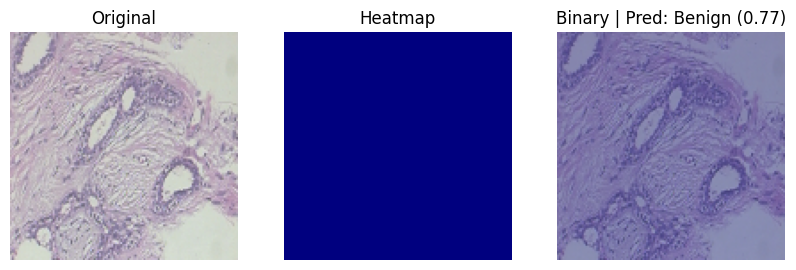

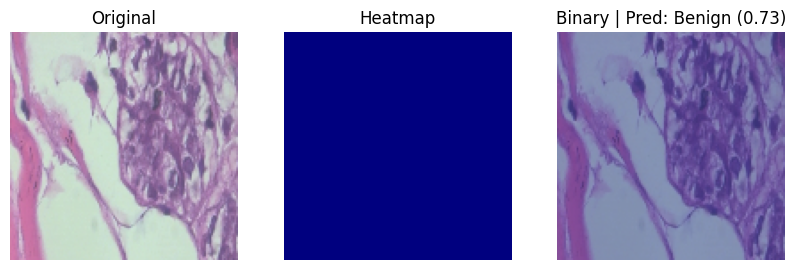

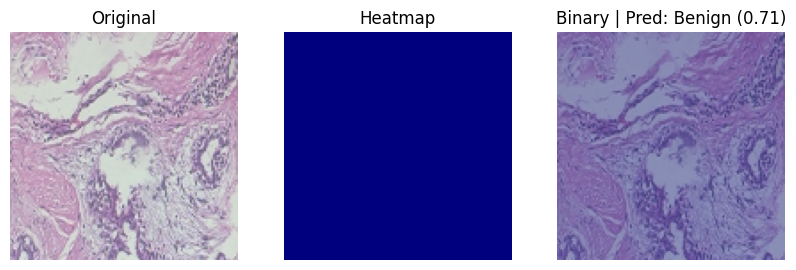

Binary model Grad-CAM on malignant examples:


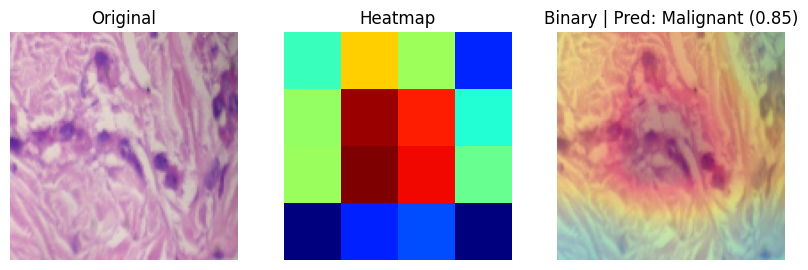

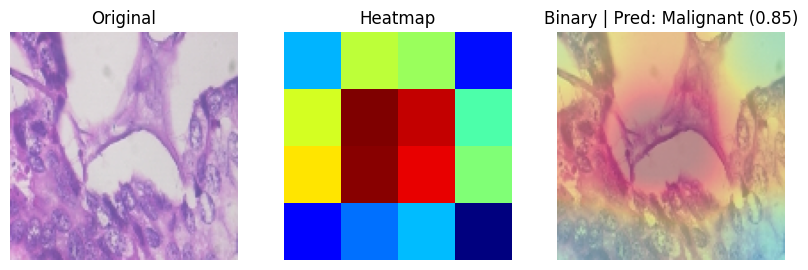

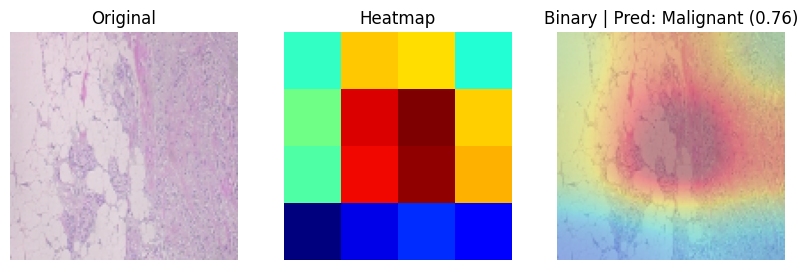

Benign subtype model Grad-CAM:


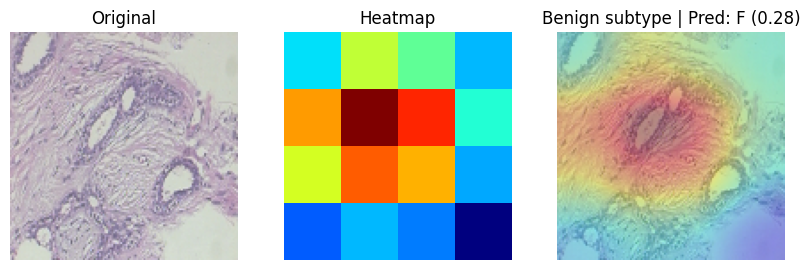

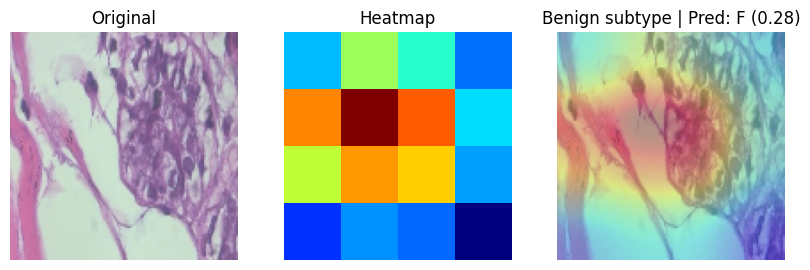

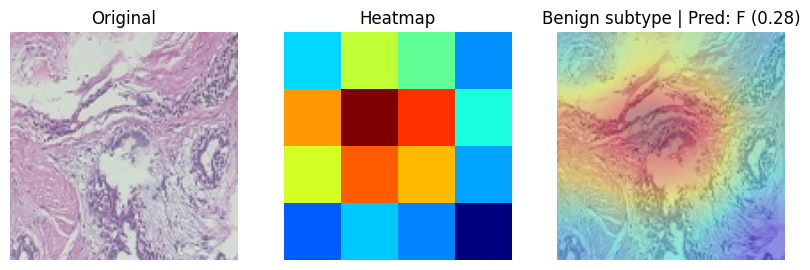

Malignant subtype model Grad-CAM:


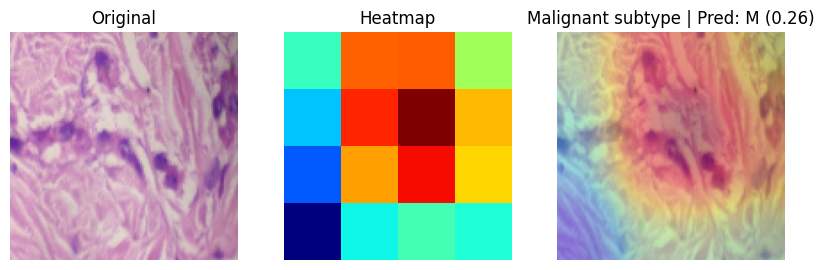

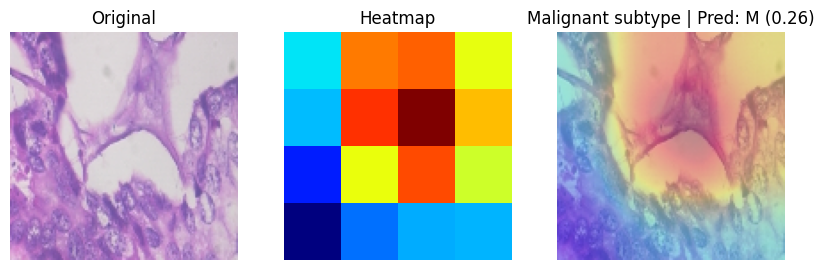

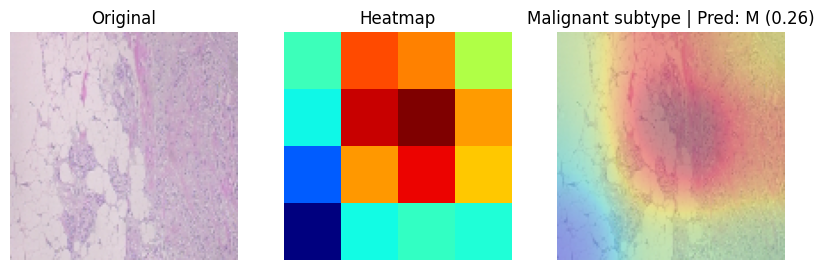

In [12]:
binary_names    = ['Benign', 'Malignant']
benign_names    = ['A','F','P','T']
malignant_names = ['D','L','M','P']

# Sample a few images per binary class (if available)
benign_paths    = test_df[test_df['binary_label']==0]['filepath'].sample(min(3, (test_df['binary_label']==0).sum()), random_state=SEED).tolist()
malig_paths     = test_df[test_df['binary_label']==1]['filepath'].sample(min(3, (test_df['binary_label']==1).sum()), random_state=SEED).tolist()

print("Binary model Grad-CAM on benign examples:")
for p in benign_paths:
    show_gradcam(binary_model, p, binary_names, title_prefix='Binary | ')

print("Binary model Grad-CAM on malignant examples:")
for p in malig_paths:
    show_gradcam(binary_model, p, binary_names, title_prefix='Binary | ')

print("Benign subtype model Grad-CAM:")
for p in benign_paths:
    show_gradcam(benign_model, p, benign_names, title_prefix='Benign subtype | ')

print("Malignant subtype model Grad-CAM:")
for p in malig_paths:
    show_gradcam(malig_model, p, malignant_names, title_prefix='Malignant subtype | ')


<h1>Auto Panels: Correct/Incorrect Grids Per Class </h1>

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


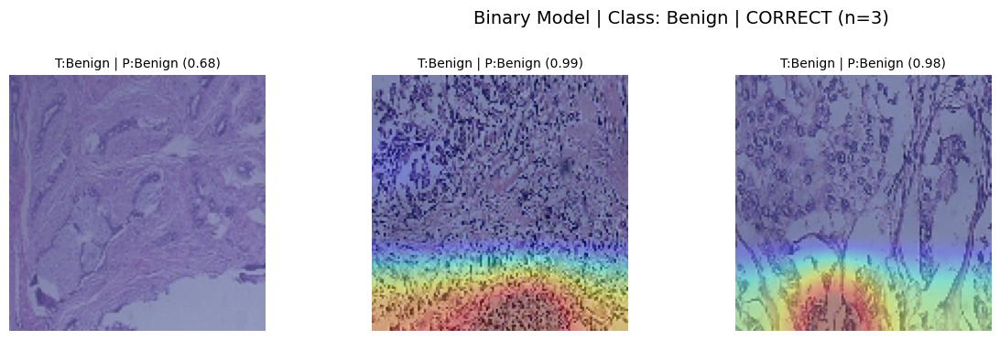

/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


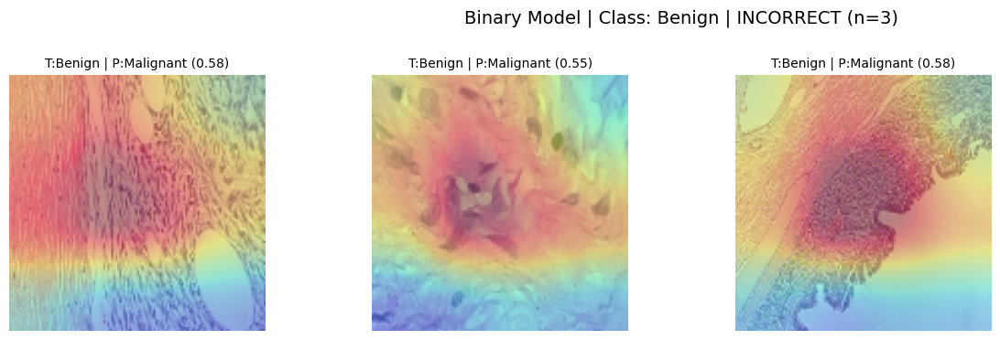

/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


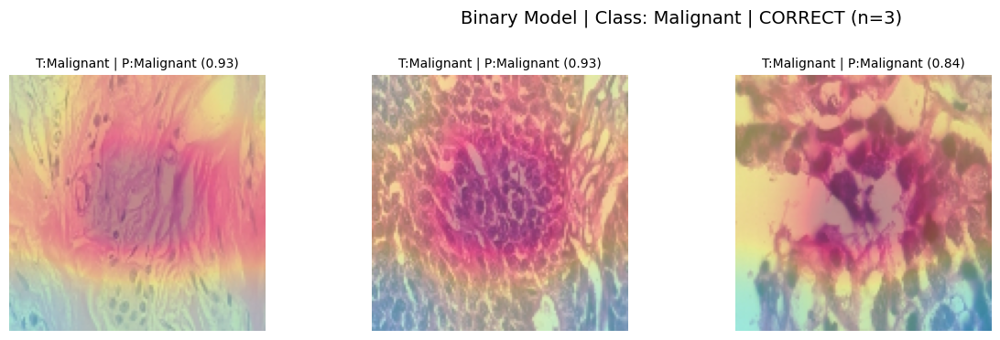

/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


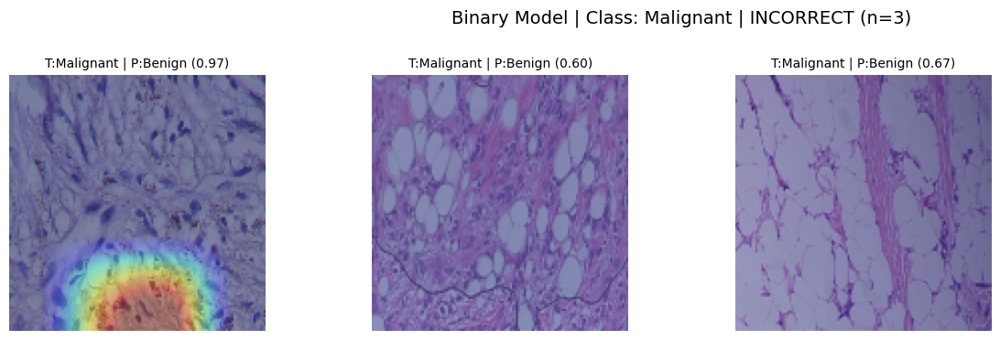

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


(No samples available) Benign Subtype Model | Class: A | CORRECT (n=0)


/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


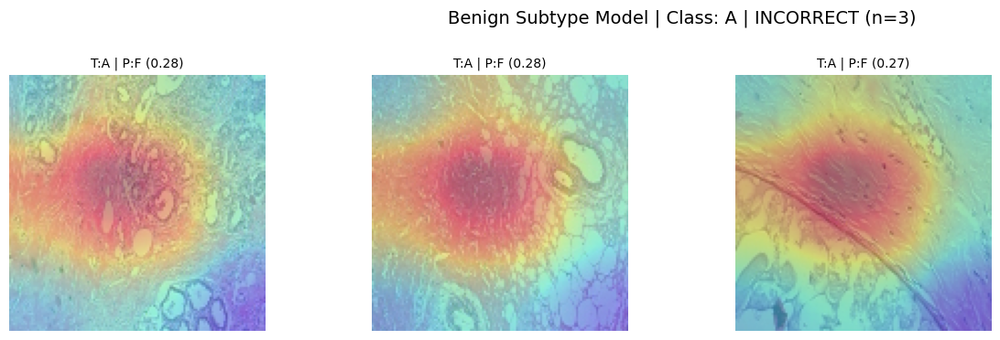

/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


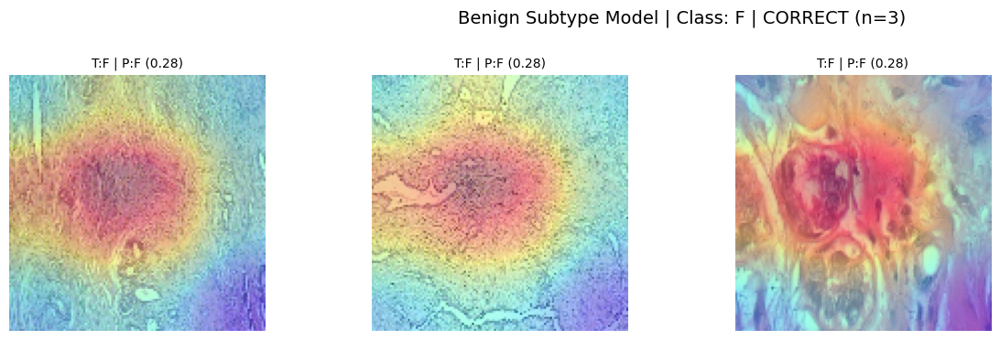

(No samples available) Benign Subtype Model | Class: F | INCORRECT (n=0)
(No samples available) Benign Subtype Model | Class: P | CORRECT (n=0)


/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


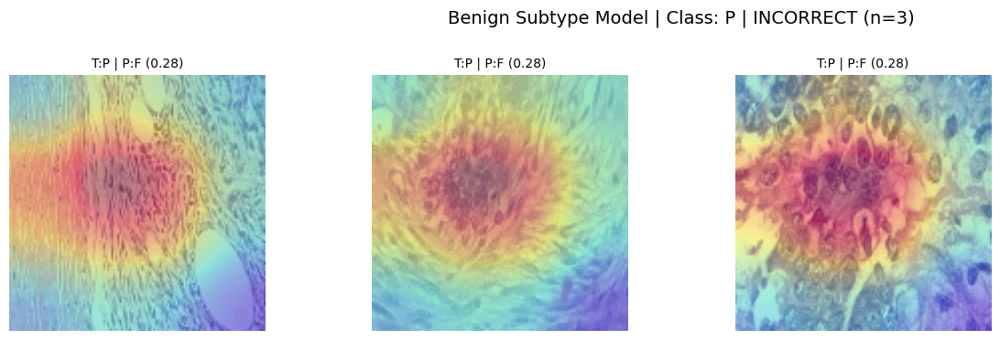

(No samples available) Benign Subtype Model | Class: T | CORRECT (n=0)


/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


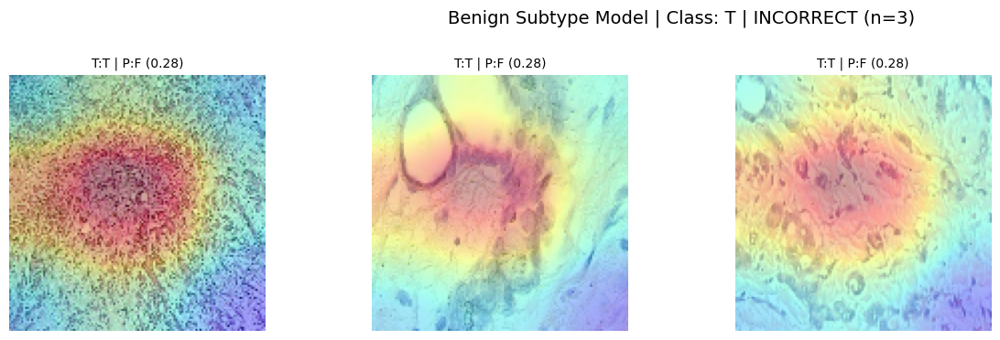

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


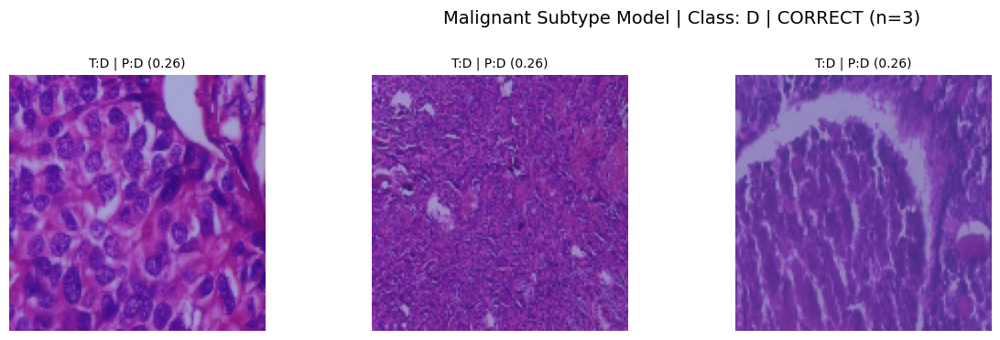

/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


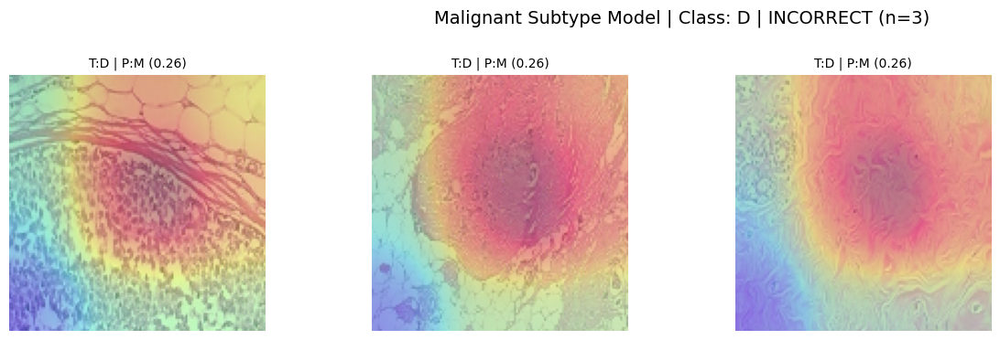

(No samples available) Malignant Subtype Model | Class: L | CORRECT (n=0)


/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


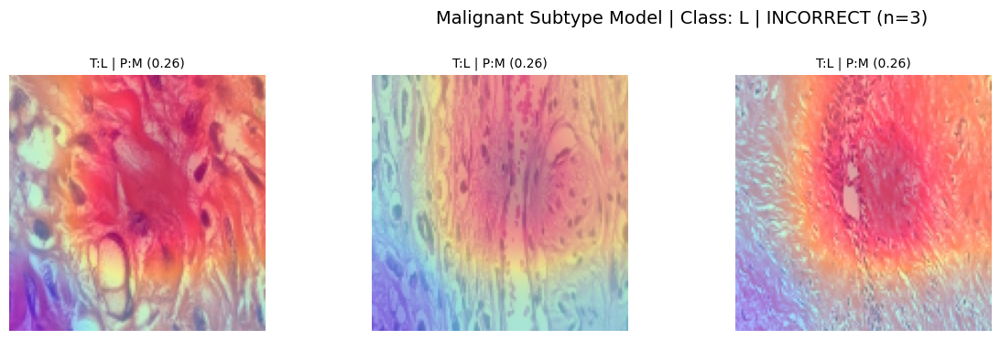

/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


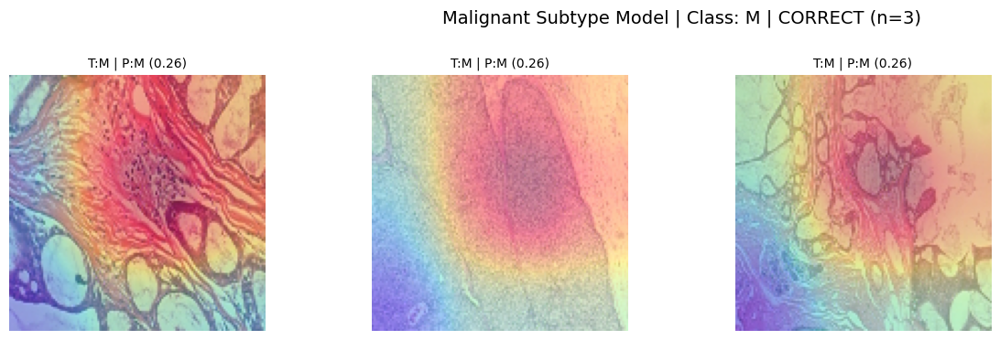

/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


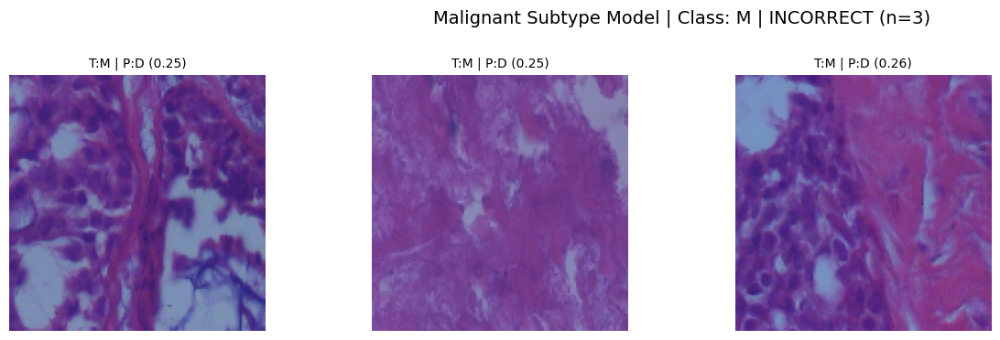

(No samples available) Malignant Subtype Model | Class: P | CORRECT (n=0)


/tmp/ipykernel_37/1125819151.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')


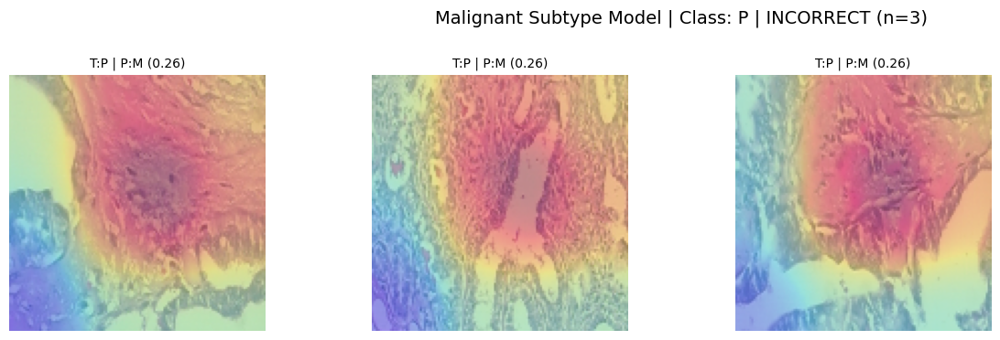

In [13]:
def predict_on_paths(model, paths, batch_size=32):
    """Run model.predict on raw file paths with the same preprocessing used in training."""
    def gen():
        for p in paths:
            imbytes = tf.io.read_file(p)
            img = tf.image.decode_png(imbytes, channels=3)
            img = tf.image.resize(img, IMG_SIZE)
            img = tf.cast(img, tf.float32)
            img = preprocess_fn(img)
            yield img
    ds = tf.data.Dataset.from_generator(
        gen,
        output_signature=tf.TensorSpec(shape=(IMG_SIZE[0], IMG_SIZE[1], 3), dtype=tf.float32)
    ).batch(batch_size)
    return model.predict(ds, verbose=0)

def build_predictions_df(model, df_subset, label_col, class_names):
    df_local = df_subset.dropna(subset=[label_col]).copy()
    paths = df_local['filepath'].tolist()
    y_true = df_local[label_col].astype(int).to_numpy()
    preds = predict_on_paths(model, paths)
    y_pred = np.argmax(preds, axis=1)
    y_prob = np.max(preds, axis=1)
    out = pd.DataFrame({'filepath': paths, 'true': y_true, 'pred': y_pred, 'prob': y_prob})
    out['correct'] = (out['true'] == out['pred']).astype(int)
    out['true_name'] = [class_names[i] for i in out['true']]
    out['pred_name'] = [class_names[i] for i in out['pred']]
    return out

def sample_per_class(df_pred, N=3):
    """Return dict[class_id] = (correct_df, incorrect_df) with up to N samples each."""
    result = {}
    for c in sorted(df_pred['true'].unique()):
        df_c = df_pred[df_pred['true'] == c]
        corr = df_c[df_c['correct'] == 1].sample(min(N, (df_c['correct']==1).sum()), random_state=SEED) if (df_c['correct']==1).sum() > 0 else df_c.head(0)
        inc  = df_c[df_c['correct'] == 0].sample(min(N, (df_c['correct']==0).sum()), random_state=SEED) if (df_c['correct']==0).sum() > 0 else df_c.head(0)
        result[c] = (corr, inc)
    return result

def gradcam_overlay_only(model, img_path, last_conv='conv5_block16_concat'):
    """Return overlay_uint8 plus predicted index/prob for grid rendering."""
    model_input, display_img = load_image_for_gradcam(img_path, target_size=IMG_SIZE)
    heatmap = make_gradcam_heatmap(model, model_input, last_conv_layer_name=last_conv)
    overlay = overlay_heatmap_on_image(heatmap, display_img, alpha=0.35)
    preds = model.predict(np.expand_dims(model_input, 0), verbose=0)[0]
    pred_idx = int(np.argmax(preds)); pred_prob = float(np.max(preds))
    return overlay, pred_idx, pred_prob

def plot_gradcam_grid(model, df_rows, class_names, title, cols=4, last_conv='conv5_block16_concat'):
    items = df_rows.to_dict('records')
    if len(items) == 0:
        print(f"(No samples available) {title}")
        return
    rows = int(np.ceil(len(items) / cols))
    plt.figure(figsize=(4*cols, 3.6*rows))
    for i, row in enumerate(items):
        overlay, pred_idx, pred_prob = gradcam_overlay_only(model, row['filepath'], last_conv=last_conv)
        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(overlay); ax.axis('off')
        ax.set_title(f"T:{row['true_name']} | P:{class_names[pred_idx]} ({pred_prob:.2f})", fontsize=10)
    plt.suptitle(title, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

def render_panels_for_model(model, df_pred, class_names, panel_title_prefix, N=3, cols=4, last_conv='conv5_block16_concat'):
    per_class = sample_per_class(df_pred, N=N)
    for c, (corr_df, inc_df) in per_class.items():
        cname = class_names[c]
        plot_gradcam_grid(model, corr_df, class_names,
                          title=f"{panel_title_prefix} | Class: {cname} | CORRECT (n={len(corr_df)})",
                          cols=cols, last_conv=last_conv)
        plot_gradcam_grid(model, inc_df, class_names,
                          title=f"{panel_title_prefix} | Class: {cname} | INCORRECT (n={len(inc_df)})",
                          cols=cols, last_conv=last_conv)

# Run panels
N_SAMPLES = 3
GRID_COLS = 4

# Binary panels
binary_names = ['Benign', 'Malignant']
binary_df_pred = build_predictions_df(
    model=binary_model,
    df_subset=test_df[['filepath','binary_label']].rename(columns={'binary_label':'binary_label'}),
    label_col='binary_label',
    class_names=binary_names
)
render_panels_for_model(binary_model,
                        binary_df_pred.rename(columns={'true':'binary_true'}).rename(columns={'binary_true':'true'}),
                        binary_names, 'Binary Model', N=N_SAMPLES, cols=GRID_COLS)

# Benign subtype panels
benign_names = ['A','F','P','T']
benign_df = test_df[test_df['binary_label']==0][['filepath','benign_label']].dropna()
benign_df_pred = build_predictions_df(benign_model,
                                      benign_df.rename(columns={'benign_label':'benign_label'}),
                                      'benign_label', benign_names)
render_panels_for_model(benign_model,
                        benign_df_pred.rename(columns={'true':'benign_true'}).rename(columns={'benign_true':'true'}),
                        benign_names, 'Benign Subtype Model', N=N_SAMPLES, cols=GRID_COLS)

# Malignant subtype panels
malignant_names = ['D','L','M','P']
malignant_df = test_df[test_df['binary_label']==1][['filepath','malignant_label']].dropna()
malignant_df_pred = build_predictions_df(malig_model,
                                         malignant_df.rename(columns={'malignant_label':'malignant_label'}),
                                         'malignant_label', malignant_names)
render_panels_for_model(malig_model,
                        malignant_df_pred.rename(columns={'true':'malignant_true'}).rename(columns={'malignant_true':'true'}),
                        malignant_names, 'Malignant Subtype Model', N=N_SAMPLES, cols=GRID_COLS)


<h1>Save Models</h1>

In [14]:
binary_model.save('binary_model.h5')
benign_model.save('benign_model.h5')
malig_model.save('malignant_model.h5')
print("Models saved to working directory.")


Models saved to working directory.
